# Drone follow me using Kalman Filters

Multi-Object Tracking (MOT) is a core visual ability that humans poses to perform kinetic tasks and coordinate other tasks. The AI community has recognized the importance of MOT via a series of [competitions](https://motchallenge.net).

In this assignment, the object class is `bicycle` and `car` the ability to track these objects  will be demonstrated using [Kalman Filters](https://en.wikipedia.org/wiki/Kalman_filter).  


## Task 1: Setup your development environment and store the test video locally (10 points)

Your environment must be docker based and you can use any TF2 or PT2 based docker container compatible with your environment. You can also use colab.

# Install Libraries

The Roboflow API allows me to import the Visdrone dataset in Yolo's data format and use it to train my model, requiring only a couple filepath changes in the data yaml. Ultralytics has an extremely well-documented and easy to use API for training their Yolo models from scratch.

In [ ]:
!pip install pytube opencv-python ultralytics roboflow filterpy

# Import Dependencies

In [ ]:
from pytube import YouTube
import os
import cv2
from filterpy.kalman import KalmanFilter
from google.colab import drive
from google.colab import files
from google.colab import userdata
# google patch for cv2.imshow
from google.colab.patches import cv2_imshow
import numpy as np
from roboflow import Roboflow
from ultralytics import YOLO

# Download Videos

Convenience function which uses the PyTube API to download the YouTube videos specified in the assignment and store them in my Google Drive

In [ ]:
def download_videos(video_id_list, output_path="."):
    """
    Download videos from YouTube based on a list of video IDs using PyTube API

    Args:
        video_id_list (list): A list of YouTube video IDs to download.
        output_path (str, optional): The directory where the downloaded videos will be saved. Defaults to ./videos
    """
    for video_id in video_id_list:
      try:
        yt = YouTube(f"https://www.youtube.com/watch?v={video_id}")
        video = yt.streams.filter(file_extension='mp4', resolution='360p').first()
        video.download(output_path)
        print(f"Video downloaded successfully: {yt.title}")
      except Exception as e:
        print(f"Error downloading video: {e}")

## Task 1 Solution

Here I use my download_videos function to download and store the drone videos to my Drive, and also save a sorted list of the video paths. Sorting the list maintains a consistent order for videos IDs in my Postgres instance

In [ ]:
# Video IDs specified in assignment
video_id_list = ["WeF4wpw7w9k", "2NFwY15tRtA", "5dRramZVu2Q"]

# Get current directory, define subdirectory for videos, and define full output path
current_directory = os.getcwd()
videos_directory = "videos"
output_path = os.path.join(current_directory, videos_directory)

# Join the current directory with the videos directory and download videos
download_videos(video_id_list, output_path)

# save all mp4 paths to video_paths list
video_paths = []
for root, dirs, files in os.walk(output_path):
  for file in files:
    full_path = os.path.join(root, file)
    video_paths.append(full_path)

# keep in sorted order for consistent IDs in PG instance
video_paths.sort()

for video_path in video_paths:
  print(video_path)

Video downloaded successfully: Cyclist and vehicle Tracking - 1
Video downloaded successfully: Cyclist and vehicle tracking - 2
Video downloaded successfully: Drone Tracking Video
/content/videos/Cyclist and vehicle Tracking - 1.mp4
/content/videos/Cyclist and vehicle tracking - 2.mp4
/content/videos/Drone Tracking Video.mp4


## Task 2: Object Detection (40 points)

Perform object detection on the following videos.

```{eval-rst}
.. youtube:: WeF4wpw7w9k
```

```{eval-rst}
.. youtube:: 2NFwY15tRtA
```

```{eval-rst}
.. youtube:: 5dRramZVu2Q
```

Split the videos into frames and use an object detector of your choice, in a framework of your choice to detect the cyclists.  

# Load Dataset

Here I use the Roboflow API to load in the Visdrone dataset from [this project](https://universe.roboflow.com/visdrone/visdrone-lzsy1). After downloading the data, I corrected some of the paths in the data.yaml file to be able to train my model

In [ ]:
# Get Roboflow client using my API key
rf = Roboflow(api_key=userdata.get('roboflow_key'))

# Retrieve project where dataset is located within Roboflow
project = rf.workspace("test-yuzee").project("visdronedi_mv")
version = project.version(3)

# Download dataset in Yolo v8 format
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.1.34, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to VisDroneDI_MV-3 in yolov8:: 100%|██████████| 14044/14044 [00:03<00:00, 4284.23it/s]


# Model Training - YOLOV8X

I trained  4 separate YOLO V8 models for 30 epocs and compared the results before training my final model. I started with the largest YOLO model (yolov8x), but found that I had to shrink the images to 320x180 to keep my GPU RAM usage under 16GB (note that the imgsz argument maintains the images' aspect ratios). Given some of the Visdrone images are as large 1920x1080, this seems to have led to significant data loss and an mAP50 rating of 32.4%, as well as a rather disastrous [confusion matrix](https://github.com/dhauss/csgy6613-assignments/blob/main/assignment-3/yolov8x_metrics/yolov8x_confusion_matrix.png). I forgot to save other relevant metrics before closing my session and losing the files, but this model clearly required much more GPU RAM in order to be useful

In [ ]:
!yolo task=detect mode=train model=yolov8x.pt data=/content/VisDroneDI_MV-3/data.yaml imgsz=320 epochs=30

#Model Training - YOLOV8L

I then tried the large YOLO V8 Model (yolov8l), and was able to train the images resized to 640x360. After running out of memory in first attempt at training, I achieved a much better, though far from optimal, mAP50 rating of 52.9% and some promising initial overall [metrics](https://github.com/dhauss/csgy6613-assignments/tree/main/assignment-3/yolov8l_metrics), noticeably some clearly improving [loss metrics](https://github.com/dhauss/csgy6613-assignments/blob/main/assignment-3/yolov8l_metrics/yolov8l_results.png). However, my GPU RAM usage was consistently near to its full capacity of 16GB, and one epoch showed 16.1GB used, so either Colab gave me a pass or the usage monitored by Ultralytics is overestimated. Either way, it seemed unlikely that I would be able to train for a significant amount of epochs without running into an out of GPU memory error.

In [ ]:
!yolo task=detect mode=train model=yolov8l.pt data=/content/VisDroneDI_MV-3/data.yaml imgsz=640 epochs=30

#Final Model Training - YOLOV8M

After achieving [comparable metrics](https://github.com/dhauss/csgy6613-assignments/tree/main/assignment-3/yolov8m_metrics) training a medium YOLO V8 model (yolov8m), I trained for 150 epochs in an attempt to improve is metrics and come out with a useable model. The improvement to its final mAP50 rating was minimal and noticeably suboptimal at 53.9%, but its [PR curve](https://github.com/dhauss/csgy6613-assignments/blob/main/assignment-3/yolov8m_150_epochs_metrics/yolov8m_150_epochs_PR_curve.png) was promising, and the [overall metrics](https://github.com/dhauss/csgy6613-assignments/tree/main/assignment-3/yolov8m_150_epochs_metrics) indicated a high level of precision which could be good enough for this task when paired with a well-tuned Kalman Filter, so I moved on to testing the model's effectiveness at detecting objects in the given videos
<br><br>
Note that I also attempted to train the smaller YOLO models with larger input sizes, but even 960x640 input images took over 16GB of GPU RAM, and 640X360 images led to poorer performance than with the medium and large YOLO models

In [ ]:
!yolo task=detect mode=train model=yolov8m.pt data=/content/VisDroneDI_MV-3/data.yaml imgsz=640 epochs=150

100% 49.7M/49.7M [00:00<00:00, 61.0MB/s]
Ultralytics YOLOv8.1.34 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/VisDroneDI_MV-3/data.yaml, epochs=150, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=F

# Save Model and Metrics to Drive

In [ ]:
# Save loss plots
files.download("/content/runs/detect/train/results.png")
# Save confusion matrix
files.download("/content/runs/detect/train/confusion_matrix.png")
# Save F1 Curve plot
files.download("/content/runs/detect/train/F1_curve.png")
# Save PR Curve plot
files.download("/content/runs/detect/train/PR_curve.png")
# Save trained YOLO model
files.download("/content/runs/detect/train/weights/best.pt")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
def display_object_detection_results(video_path, detection_model, sample_rate=50):
  """
  Displays object detection results from an Ultralytics YOLO model on frames extracted from a video.

  Parameters:
  - video_path (str): Path to the input video file.
  - detection_model: Object detection model capable of performing inference on video frames, must be an Ultralytics YOLO model to work properly.
  - sample_rate (int): Rate at which frames are sampled for processing. Default is 50.

  Notes:
    - The sample_rate parameter determines how frequently frames are processed. For example, if sample_rate=50,
      every 50th frame will be processed. This is to be able to display a reasonable sample of frames from videos
      of different lengths.
    - The function utilizes the cv2_imshow Google patch for OpenCV to display the annotated frames.
  """
  cap = cv2.VideoCapture(video_path)
  # Variable to count frames
  frame_count = 0
  # Loop through the video frames
  while cap.isOpened():
      # Read a frame from the video
      success, frame = cap.read()

      if success:
          # Increment the frame count
          frame_count += 1

          # Display every sample_rate'th frame, e.g. defaults to every 50th frame
          if frame_count % sample_rate == 0:
              # Run YOLOv8 inference on the frame
              results = detection_model(frame)

              # Visualize the results on the frame
              annotated_frame = results[0].plot()

              # Display the annotated frame
              cv2_imshow(annotated_frame)
      else:
          # Release the video capture object
          cap.release()
          # Break the loop if the end of the video is reached
          break

# Object Detection Results: Cyclist and vehicle Tracking - 1

For convenience, I display a sample of frames from the first video using a sample rate of 250 to keep the output reasonable. See the full mp4 results [here](https://drive.google.com/file/d/1w0Ura1p7FdG-fa2cnWsnjIRyJJcbveVJ/view?usp=drive_lin). Note that the results in the video detect the car much better than is implied by this sample, but the model largely fails to track the cyclist. Given the cyclist is often difficult to see as a human, I suspect I would need an extra large YOLO model trained for a large number epochs in order to consistently detect it, which would require far more GPU RAM than I have available to me. Fine tuning a pretrained model also would perhaps be better able to track the cyclist


0: 352x640 1 0 - Person, 1 1 - car, 115.4ms
Speed: 6.1ms preprocess, 115.4ms inference, 931.3ms postprocess per image at shape (1, 3, 352, 640)


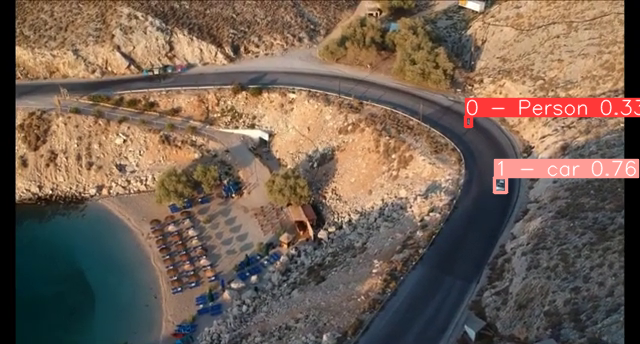


0: 352x640 1 1 - car, 10.2ms
Speed: 1.5ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 352, 640)


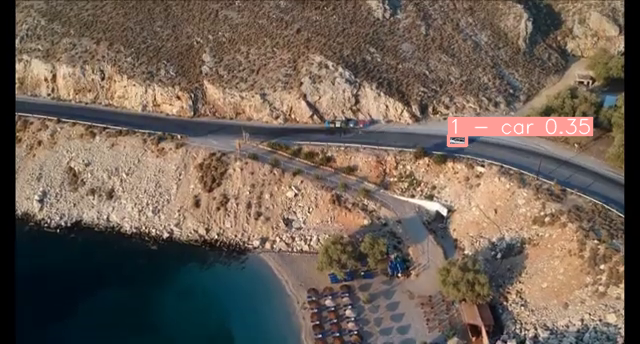


0: 352x640 (no detections), 9.5ms
Speed: 1.1ms preprocess, 9.5ms inference, 0.7ms postprocess per image at shape (1, 3, 352, 640)


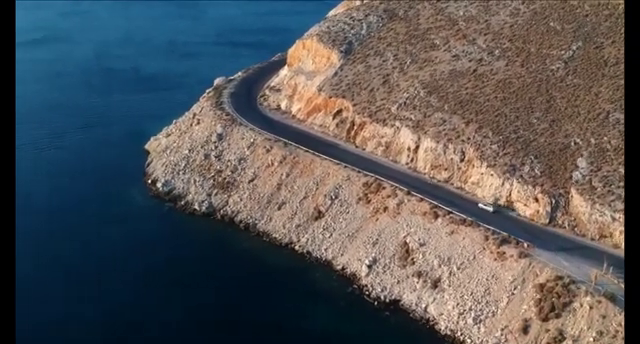


0: 352x640 2 1 - cars, 8.7ms
Speed: 1.3ms preprocess, 8.7ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)


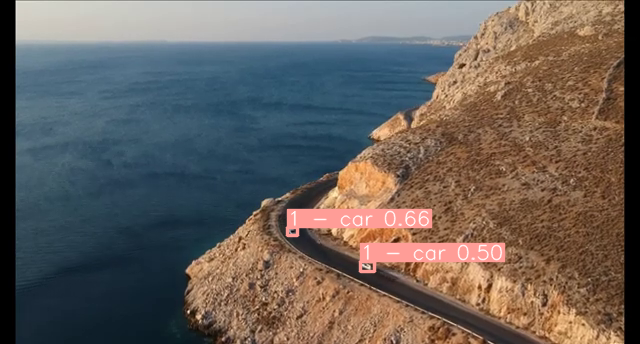


0: 352x640 (no detections), 8.4ms
Speed: 1.4ms preprocess, 8.4ms inference, 0.7ms postprocess per image at shape (1, 3, 352, 640)


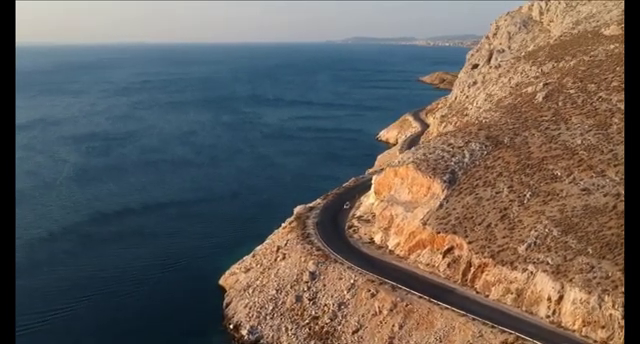

In [ ]:
# Load the YOLOv8 model
model_path = "/content/drive/MyDrive/Colab Notebooks/yolov8m_150_epochs_best.pt"
detection_model = YOLO(model_path)

# display sample frames from first video
display_object_detection_results(video_paths[0], detection_model, sample_rate=250)

# Object Detection Results: Cyclist and vehicle Tracking - 2

A sample of frames from the second video. Although not entirely evident from these samples, it did a better job detecting the cyclist, and detected the car quite well. See the full mp4 results [here](https://drive.google.com/file/d/1-4JCl4cQcXbYwapqS0-vdjBUhbeudhTN/view?usp=drive_link).


0: 352x640 2 0 - Persons, 10.8ms
Speed: 1.3ms preprocess, 10.8ms inference, 1.6ms postprocess per image at shape (1, 3, 352, 640)


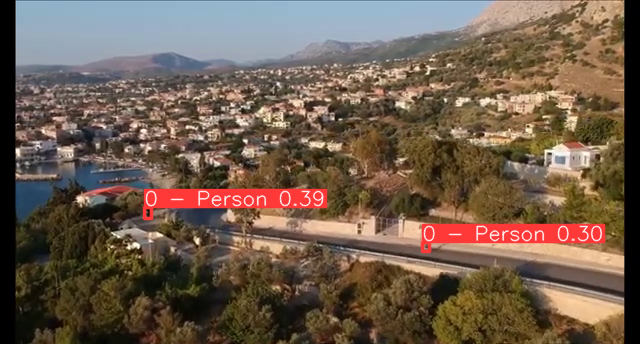


0: 352x640 (no detections), 10.7ms
Speed: 1.4ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 352, 640)


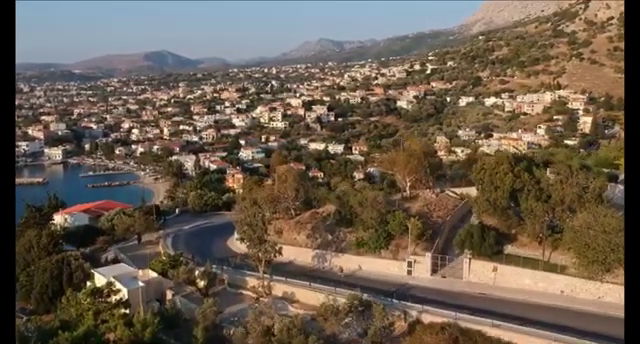


0: 352x640 (no detections), 10.9ms
Speed: 1.4ms preprocess, 10.9ms inference, 0.8ms postprocess per image at shape (1, 3, 352, 640)


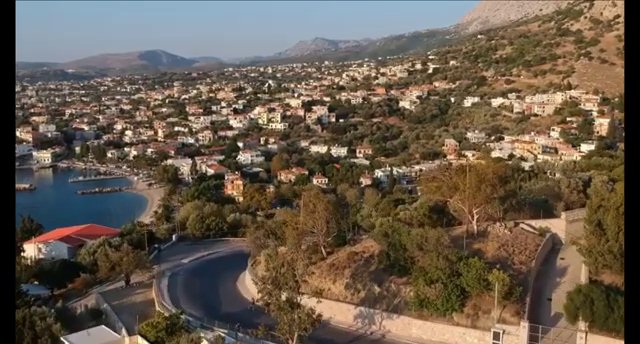


0: 352x640 (no detections), 11.6ms
Speed: 1.5ms preprocess, 11.6ms inference, 0.8ms postprocess per image at shape (1, 3, 352, 640)


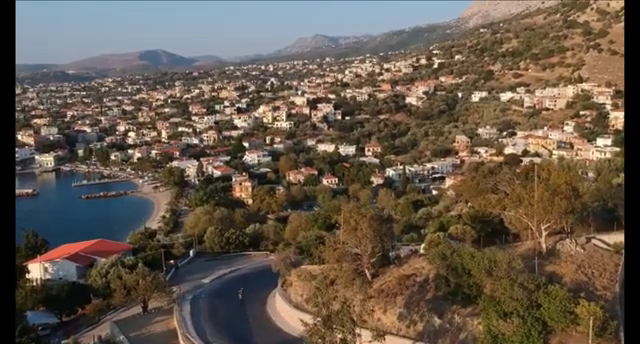


0: 352x640 (no detections), 10.7ms
Speed: 1.5ms preprocess, 10.7ms inference, 0.8ms postprocess per image at shape (1, 3, 352, 640)


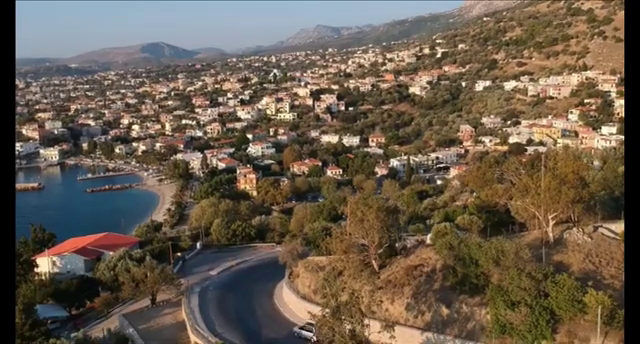


0: 352x640 1 1 - car, 10.2ms
Speed: 1.4ms preprocess, 10.2ms inference, 1.5ms postprocess per image at shape (1, 3, 352, 640)


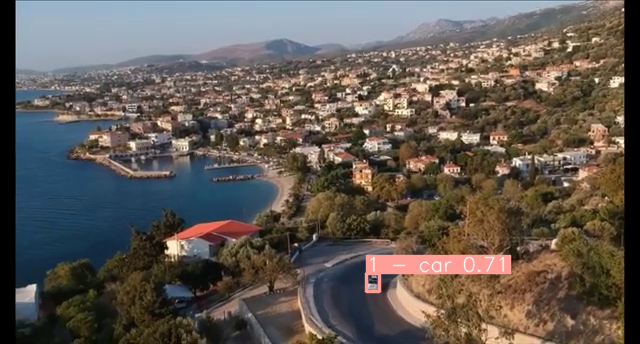


0: 352x640 (no detections), 10.6ms
Speed: 1.3ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 352, 640)


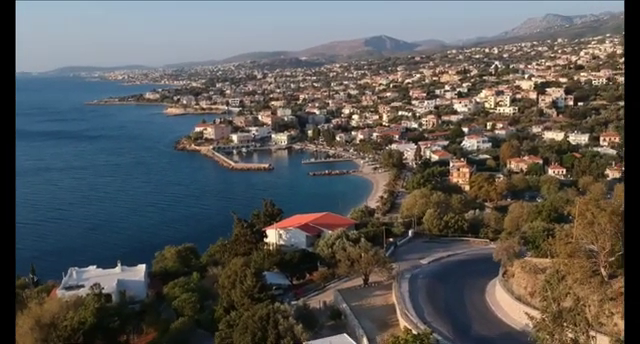

In [ ]:
# display sample frames from second video
display_object_detection_results(video_paths[1], detection_model, sample_rate=70)

# Object Detection Results: Drone Tracking

A sample of frames from the third video, see the full mp4 results [here](https://drive.google.com/file/d/1-0YG2nyw4h4Y13-9SRti9MJp_djXf73P/view?usp=drive_link). Here we can see the cyclist is detected more consistently than in the second video, and I again suggest watching the full video for a better understanding of the model's overall performance.


0: 384x640 3 0 - Persons, 141.6ms
Speed: 1.8ms preprocess, 141.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


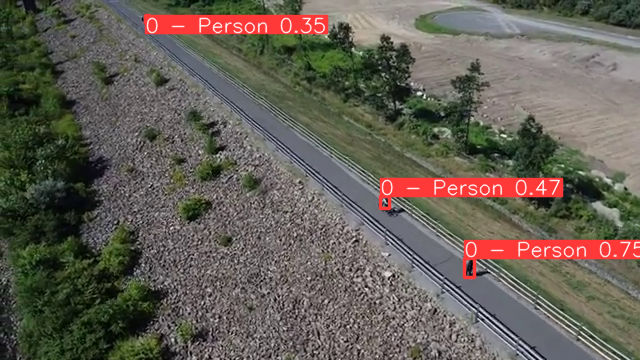


0: 384x640 7 0 - Persons, 12.4ms
Speed: 1.6ms preprocess, 12.4ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


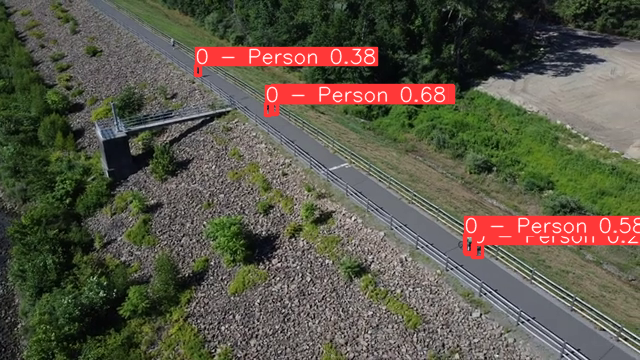


0: 384x640 3 0 - Persons, 13.5ms
Speed: 1.4ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


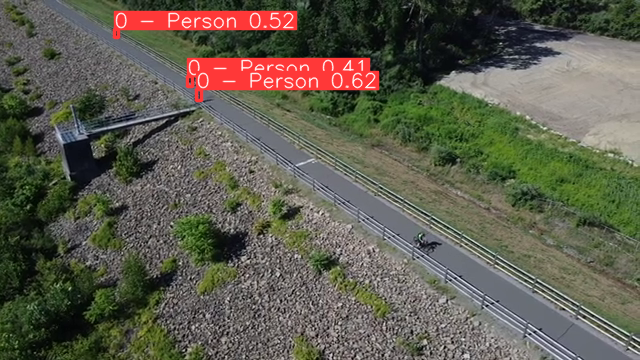


0: 384x640 1 0 - Person, 14.9ms
Speed: 1.6ms preprocess, 14.9ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)


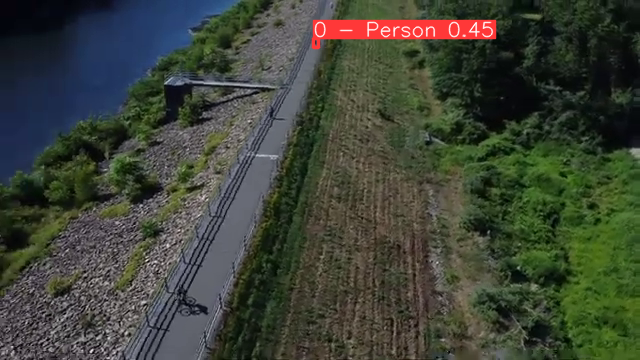


0: 384x640 2 0 - Persons, 10.7ms
Speed: 1.3ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


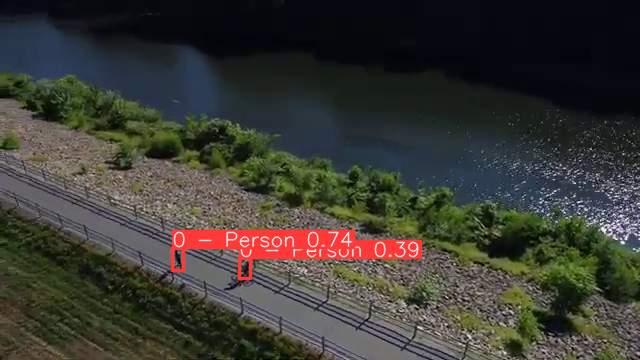


0: 384x640 1 0 - Person, 11.1ms
Speed: 1.6ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


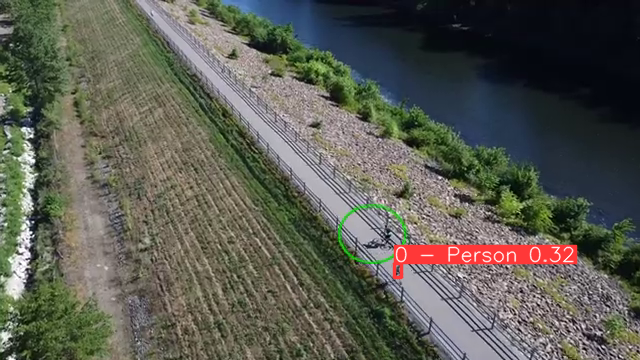


0: 384x640 (no detections), 13.0ms
Speed: 2.1ms preprocess, 13.0ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


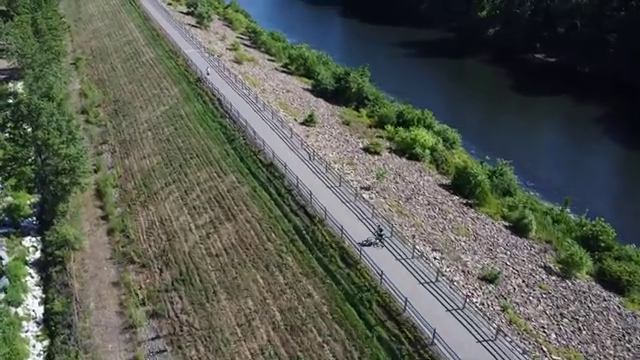


0: 384x640 1 0 - Person, 3 1 - cars, 13.1ms
Speed: 2.1ms preprocess, 13.1ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)


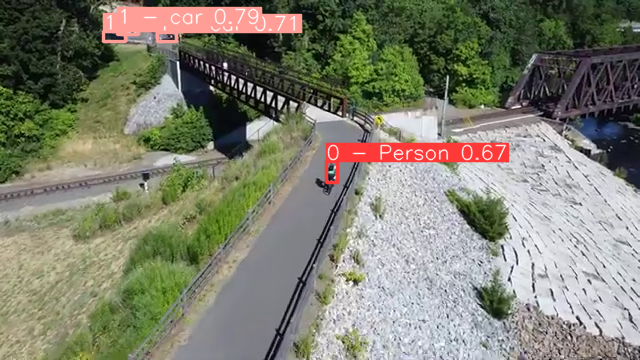


0: 384x640 6 0 - Persons, 1 1 - car, 1 3 - twowheeler, 12.8ms
Speed: 1.4ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


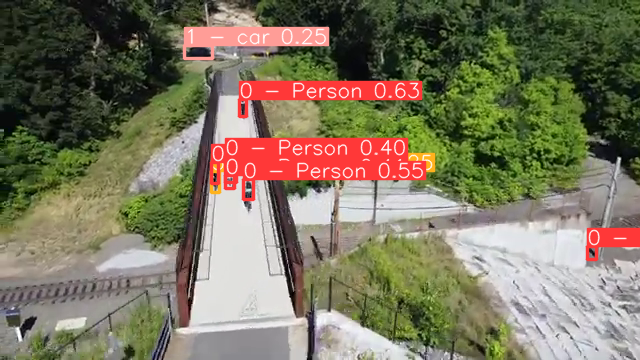

In [ ]:
# display sample frames from third video
display_object_detection_results(video_paths[2], detection_model, sample_rate=250)

# Object Detection Results: Extra Credit Video

Although again not entirely indicative in this sample, the [video results](https://drive.google.com/file/d/181KmhtkdsdIVbPU1sR9j1RfPc2euFBwy/view?usp=drive_link) show the cyclist was detected consistently by the model.

Video downloaded successfully: Dji Mavic air 2 drone using litchi app with "follow me" mode on a bike, occluded by trees

0: 384x640 3 0 - Persons, 113.9ms
Speed: 1.4ms preprocess, 113.9ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


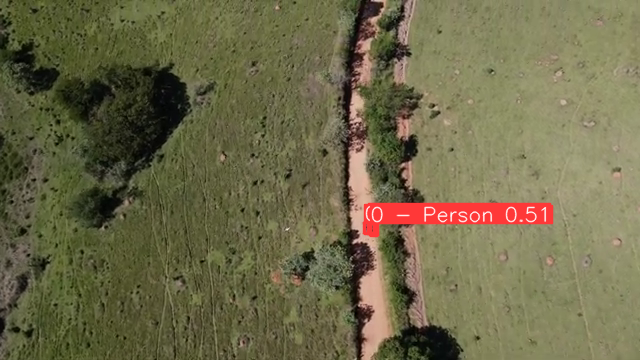


0: 384x640 2 0 - Persons, 11.6ms
Speed: 1.3ms preprocess, 11.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


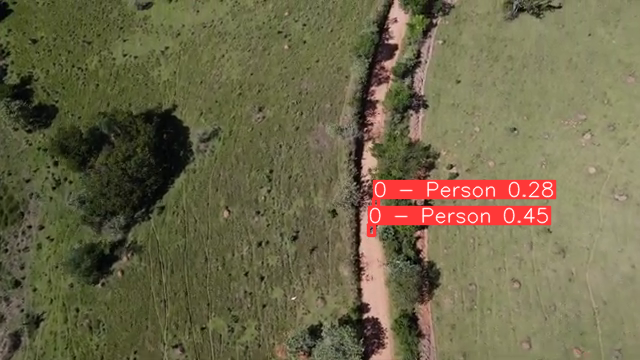


0: 384x640 1 0 - Person, 10.2ms
Speed: 1.4ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


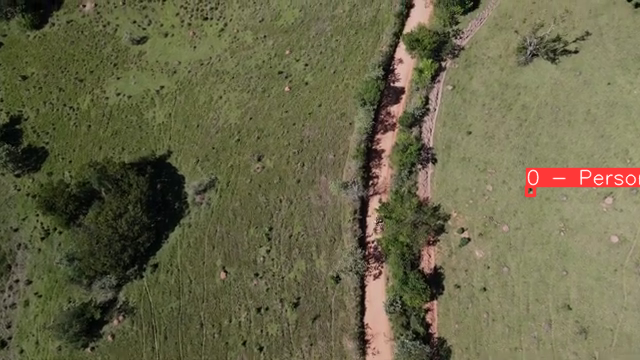


0: 384x640 (no detections), 8.6ms
Speed: 1.1ms preprocess, 8.6ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


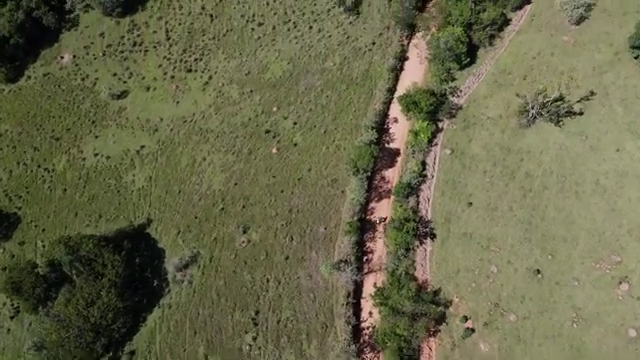


0: 384x640 1 0 - Person, 1 2 - truck, 8.9ms
Speed: 2.0ms preprocess, 8.9ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


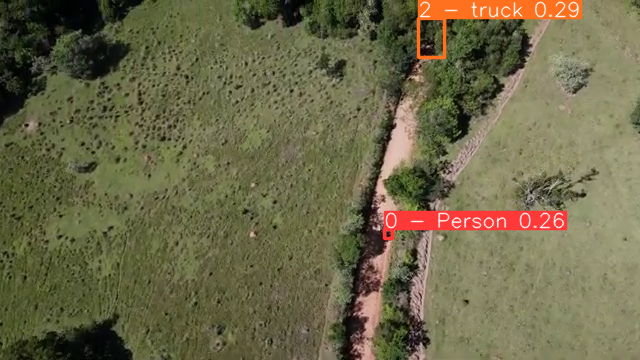


0: 384x640 2 0 - Persons, 9.0ms
Speed: 1.3ms preprocess, 9.0ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


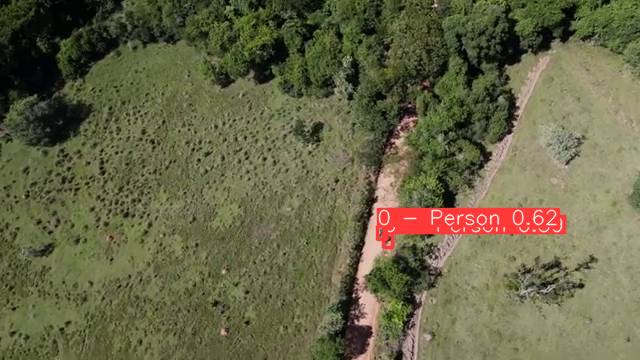


0: 384x640 (no detections), 11.3ms
Speed: 1.5ms preprocess, 11.3ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


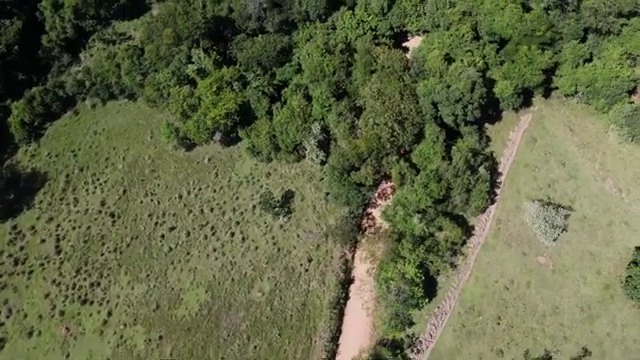


0: 384x640 (no detections), 8.8ms
Speed: 1.2ms preprocess, 8.8ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


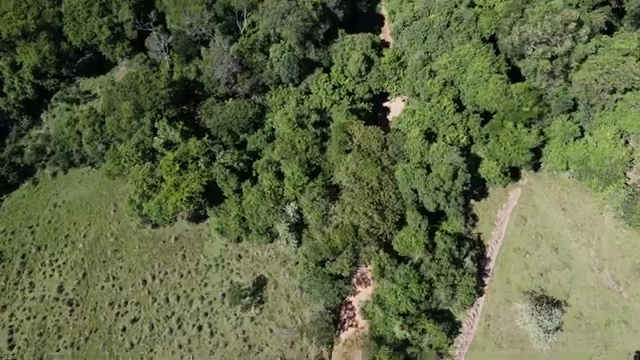


0: 384x640 (no detections), 12.1ms
Speed: 1.3ms preprocess, 12.1ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


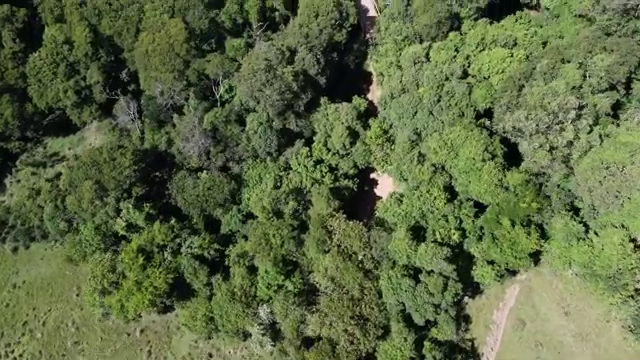


0: 384x640 (no detections), 9.3ms
Speed: 1.7ms preprocess, 9.3ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


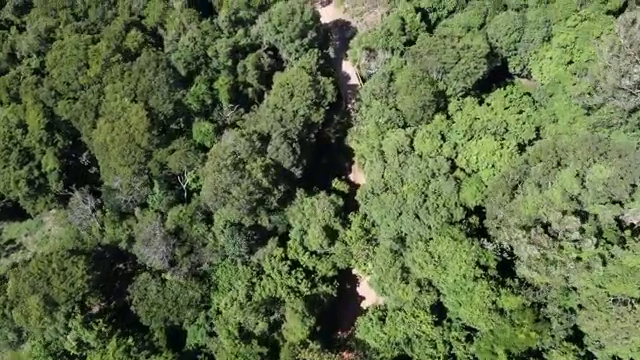


0: 384x640 1 0 - Person, 11.2ms
Speed: 1.9ms preprocess, 11.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


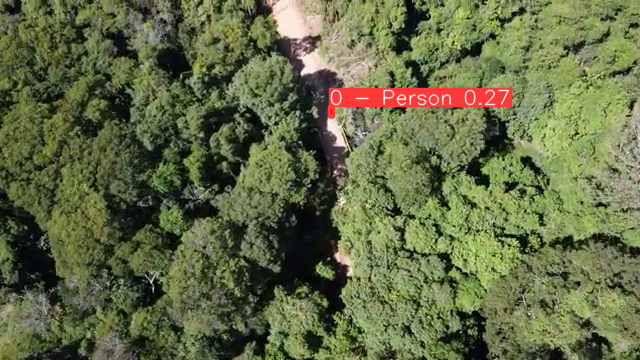


0: 384x640 (no detections), 8.9ms
Speed: 1.2ms preprocess, 8.9ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


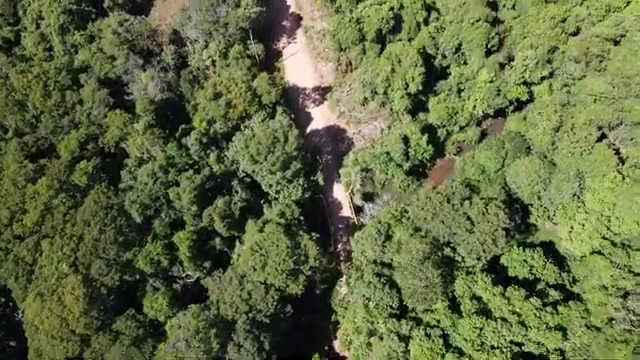


0: 384x640 1 0 - Person, 8.4ms
Speed: 1.2ms preprocess, 8.4ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


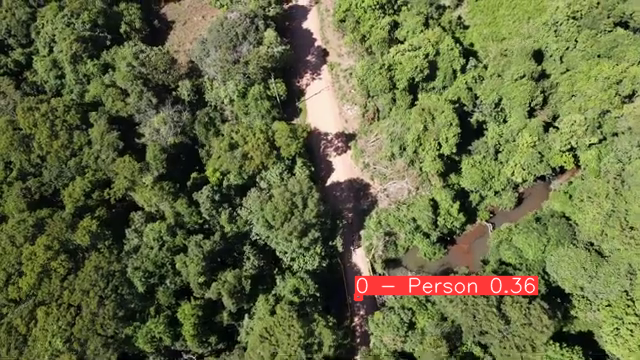


0: 384x640 (no detections), 9.2ms
Speed: 1.2ms preprocess, 9.2ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


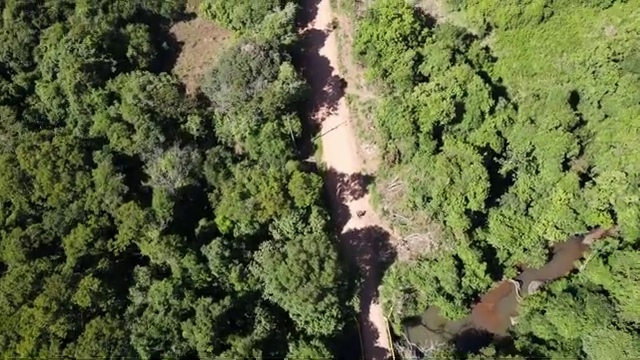


0: 384x640 1 0 - Person, 9.3ms
Speed: 1.5ms preprocess, 9.3ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


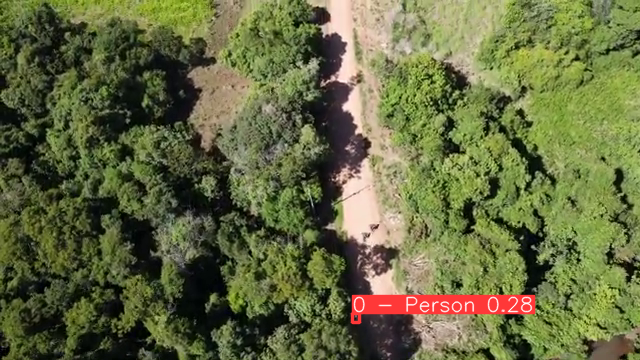


0: 384x640 (no detections), 10.7ms
Speed: 1.3ms preprocess, 10.7ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


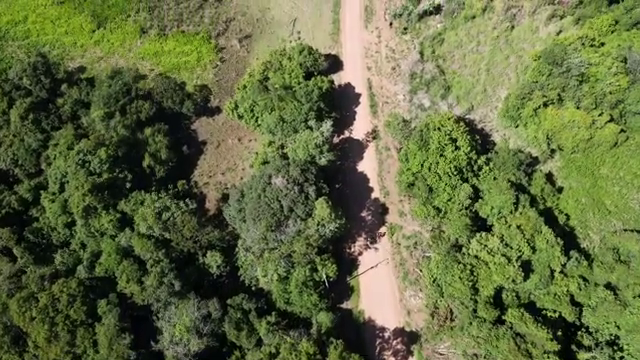


0: 384x640 (no detections), 10.3ms
Speed: 1.3ms preprocess, 10.3ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


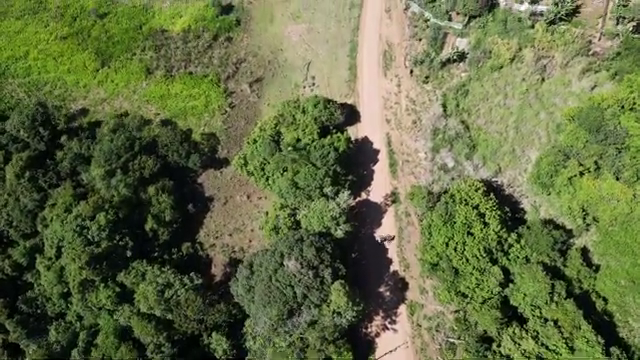


0: 384x640 (no detections), 11.3ms
Speed: 1.3ms preprocess, 11.3ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


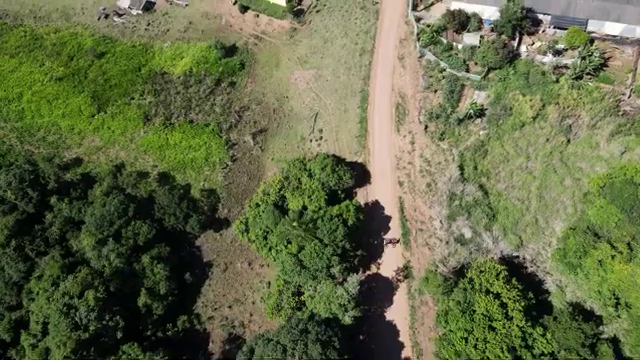


0: 384x640 3 0 - Persons, 11.5ms
Speed: 1.4ms preprocess, 11.5ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)


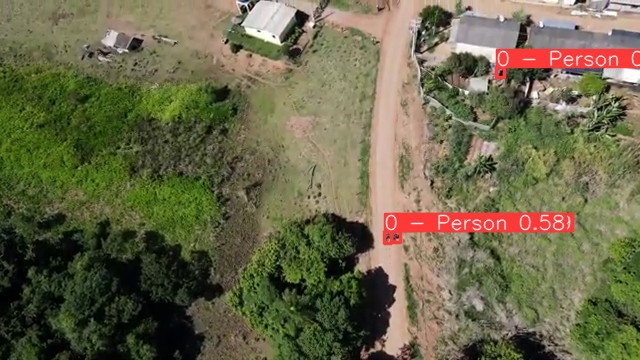

In [ ]:
# Download the extra credit video using given video id
ec_video_id = ["2hQx48U1L-Y"]
download_videos(ec_video_id, output_path)
# Save full video path
ec_video_path = "/content/videos/Dji Mavic air 2 drone using litchi app with follow me mode on a bike occluded by trees.mp4"
# Display results
display_object_detection_results(ec_video_path, detection_model, sample_rate=50)

# Save MP4 Results to Google Drive

I ran this manually for each video to save all results to the files linked above. Click the following links to watch the results from the [first video](https://drive.google.com/file/d/1w0Ura1p7FdG-fa2cnWsnjIRyJJcbveVJ/view?usp=drive_lin), [second video](https://drive.google.com/file/d/1-4JCl4cQcXbYwapqS0-vdjBUhbeudhTN/view?usp=drive_link), [third video](https://drive.google.com/file/d/1-0YG2nyw4h4Y13-9SRti9MJp_djXf73P/view?usp=drive_link), and the [extra credit video](https://drive.google.com/file/d/181KmhtkdsdIVbPU1sR9j1RfPc2euFBwy/view?usp=drive_link)

In [ ]:
# Load the YOLOv8 model
model_path = "/content/drive/MyDrive/Colab Notebooks/yolov8m_150_epochs_best.pt"
model = YOLO(model_path)

# Open the video file
video_path = "/content/videos/Dji Mavic air 2 drone using litchi app with follow me mode on a bike occluded by trees.mp4"
cap = cv2.VideoCapture(video_path)

# Get the video frame width and height
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Define the codec and create a VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
output_video_path = "/content/drive/MyDrive/Colab Notebooks/extra_credit_video_results.mp4"
out = cv2.VideoWriter(output_video_path, fourcc, 20.0, (frame_width, frame_height))

# Variable to count frames
frame_count = 0

# Loop through the video frames
while cap.isOpened():
    # Read a frame from the video
    success, frame = cap.read()

    if success:
        # Run YOLOv8 inference on the frame
        results = model(frame)

        # Visualize the results on the frame
        annotated_frame = results[0].plot()

        # Write the annotated frame to the output video
        out.write(annotated_frame)

    else:
        # Release the VideoWriter object
        out.release()

        # Break the loop if the end of the video is reached
        break